# POLYCYSTIC OVARY SYNDROME PREDICTION

Polycystic Ovary Syndrome (PCOS), which is a hormonal disorder that affects people with ovaries, primarily women of reproductive age. It's a common condition that can lead to a range of health issues. The exact cause of PCOS is not fully understood, but it involves a combination of genetic and environmental factors.

# NOTES

The dataset contains

for every yes/no question, indications are Yes = 1 ; No = 0

Blood Group indications: A+ = 11, A- = 12, B+ = 13, B- = 14, O+ =15, O- = 16, AB+ =17, AB- = 18

RBS means Random Glucose Test

In [1]:
# Importing relevant libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import warnings
warnings.filterwarnings('ignore')

Importing Dataset

In [2]:
pcos_df = pd.read_csv("data without infertility _final.csv")

In [3]:
# Displaying the first few rows of the DataFrame

pcos_df.head()  

,Sl. No,Patient File No.,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),...,Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm),Unnamed: 42
0,1,10001,0,28,44.6,152.0,19.300000,15,78,22,...,1.0,0,110,80,3,3,18.0,18.0,8.5,NaN
1,2,10002,0,36,65.0,161.5,24.921163,15,74,20,...,0.0,0,120,70,3,5,15.0,14.0,3.7,NaN
2,3,10003,1,33,68.8,165.0,25.270891,11,72,18,...,1.0,0,120,80,13,15,18.0,20.0,10.0,NaN
3,4,10004,0,37,65.0,148.0,29.674945,13,72,20,...,0.0,0,120,70,2,2,15.0,14.0,7.5,NaN
4,5,10005,0,25,52.0,161.0,20.060954,11,72,18,...,0.0,0,120,80,3,4,16.0,14.0,7.0,NaN


In [4]:
# Having a look at the end side of the dataset

pcos_df.tail()

,Sl. No,Patient File No.,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),...,Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm),Unnamed: 42
536,537,10537,0,35,50.0,164.592,18.5,17,72,16,...,0.0,0,110,70,1,0,17.5,10.0,6.7,NaN
537,538,10538,0,30,63.2,158.000,25.3,15,72,18,...,0.0,0,110,70,9,7,19.0,18.0,8.2,NaN
538,539,10539,0,36,54.0,152.000,23.4,13,74,20,...,0.0,0,110,80,1,0,18.0,9.0,7.3,NaN
539,540,10540,0,27,50.0,150.000,22.2,15,74,20,...,0.0,0,110,70,7,6,18.0,16.0,11.5,NaN
540,541,10541,1,23,82.0,165.000,30.1,13,80,20,...,1.0,0,120,70,9,10,19.0,18.0,6.9,NaN


In [5]:
# Now let’s have a look at all the columns/variables in the dataset:

print(pcos_df.columns)

Index(['Sl. No', 'Patient File No.', 'PCOS (Y/N)', ' Age (yrs)', 'Weight (Kg)',
       'Height(Cm) ', 'BMI', 'Blood Group', 'Pulse rate(bpm) ',
       'RR (breaths/min)', 'Hb(g/dl)', 'Cycle(R/I)', 'Cycle length(days)',
       'Marraige Status (Yrs)', 'Pregnant(Y/N)', 'No. of aborptions',
       'FSH(mIU/mL)', 'LH(mIU/mL)', 'FSH/LH', 'Hip(inch)', 'Waist(inch)',
       'Waist:Hip Ratio', 'TSH (mIU/L)', 'AMH(ng/mL)', 'PRL(ng/mL)',
       'Vit D3 (ng/mL)', 'PRG(ng/mL)', 'RBS(mg/dl)', 'Weight gain(Y/N)',
       'hair growth(Y/N)', 'Skin darkening (Y/N)', 'Hair loss(Y/N)',
       'Pimples(Y/N)', 'Fast food (Y/N)', 'Reg.Exercise(Y/N)',
       'BP _Systolic (mmHg)', 'BP _Diastolic (mmHg)', 'Follicle No. (L)',
       'Follicle No. (R)', 'Avg. F size (L) (mm)', 'Avg. F size (R) (mm)',
       'Endometrium (mm)', 'Unnamed: 42'],
      dtype='object')


In [6]:
# checking the shape of the data

print(f"The number of rows and columns in the dataset: {pcos_df.shape}")

The number of rows and columns in the dataset: (541, 43)


In [7]:
# checking infomation in the dataset

pcos_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 43 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Sl. No                 541 non-null    int64  
 1   Patient File No.       541 non-null    int64  
 2   PCOS (Y/N)             541 non-null    int64  
 3    Age (yrs)             541 non-null    int64  
 4   Weight (Kg)            541 non-null    float64
 5   Height(Cm)             541 non-null    float64
 6   BMI                    541 non-null    float64
 7   Blood Group            541 non-null    int64  
 8   Pulse rate(bpm)        541 non-null    int64  
 9   RR (breaths/min)       541 non-null    int64  
 10  Hb(g/dl)               541 non-null    float64
 11  Cycle(R/I)             541 non-null    int64  
 12  Cycle length(days)     541 non-null    int64  
 13  Marraige Status (Yrs)  540 non-null    float64
 14  Pregnant(Y/N)          541 non-null    int64  
 15  No. of

In [8]:
# checking datatypes with respect to columns

pcos_df.dtypes

Sl. No                     int64
Patient File No.           int64
PCOS (Y/N)                 int64
 Age (yrs)                 int64
Weight (Kg)              float64
Height(Cm)               float64
BMI                      float64
Blood Group                int64
Pulse rate(bpm)            int64
RR (breaths/min)           int64
Hb(g/dl)                 float64
Cycle(R/I)                 int64
Cycle length(days)         int64
Marraige Status (Yrs)    float64
Pregnant(Y/N)              int64
No. of aborptions          int64
FSH(mIU/mL)              float64
LH(mIU/mL)               float64
FSH/LH                   float64
Hip(inch)                  int64
Waist(inch)                int64
Waist:Hip Ratio          float64
TSH (mIU/L)              float64
AMH(ng/mL)                object
PRL(ng/mL)               float64
Vit D3 (ng/mL)           float64
PRG(ng/mL)               float64
RBS(mg/dl)               float64
Weight gain(Y/N)           int64
hair growth(Y/N)           int64
Skin darke

# Data cleaning and preprocessing

In [9]:
#checking for null values

pcos_df.isnull().sum()

Sl. No                     0
Patient File No.           0
PCOS (Y/N)                 0
 Age (yrs)                 0
Weight (Kg)                0
Height(Cm)                 0
BMI                        0
Blood Group                0
Pulse rate(bpm)            0
RR (breaths/min)           0
Hb(g/dl)                   0
Cycle(R/I)                 0
Cycle length(days)         0
Marraige Status (Yrs)      1
Pregnant(Y/N)              0
No. of aborptions          0
FSH(mIU/mL)                0
LH(mIU/mL)                 0
FSH/LH                     0
Hip(inch)                  0
Waist(inch)                0
Waist:Hip Ratio            0
TSH (mIU/L)                0
AMH(ng/mL)                 0
PRL(ng/mL)                 0
Vit D3 (ng/mL)             0
PRG(ng/mL)                 0
RBS(mg/dl)                 0
Weight gain(Y/N)           0
hair growth(Y/N)           0
Skin darkening (Y/N)       0
Hair loss(Y/N)             0
Pimples(Y/N)               0
Fast food (Y/N)            1
Reg.Exercise(Y

<Axes: >

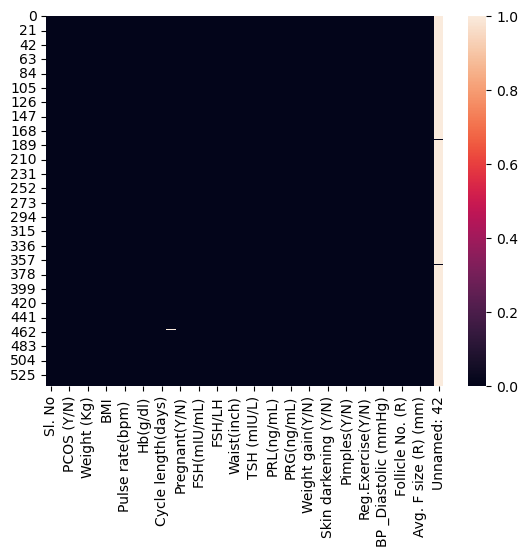

In [10]:
# visualizing mising values using heatmap 

sns.heatmap(pcos_df.isnull())

In [11]:
# Converting AMH (ng/ml) datatype from object to float as it has numeric values 

pcos_df["AMH(ng/mL)"] = pd.to_numeric(pcos_df["AMH(ng/mL)"], errors = "coerce")

In [12]:
# replacing marriage status, AMH(ng/mL) and fast food null value with median
# The median is less sensitive to outliers compared to the mean
# When the data has a skewed distribution or contains outliers, median preserves the general shape of the distribution.

pcos_df["Marraige Status (Yrs)"].fillna(pcos_df["Marraige Status (Yrs)"].median(), inplace=True)

pcos_df["Fast food (Y/N)"].fillna(pcos_df["Fast food (Y/N)"].median(),inplace = True)

pcos_df["AMH(ng/mL)"].fillna(pcos_df["AMH(ng/mL)"].median(),inplace = True)

In [13]:
# checking the number of unique values in each column

#df.nunique()

pcos_df.nunique().to_frame("No. of unique values")

,No. of unique values
Sl. No,541
Patient File No.,541
PCOS (Y/N),2
Age (yrs),29
Weight (Kg),117
Height(Cm),50
BMI,355
Blood Group,8
Pulse rate(bpm),11
RR (breaths/min),8


In [14]:
# Checking for duplicate rows

duplicated_rows = pcos_df.duplicated(keep=False)

if duplicated_rows.any():
    print("Duplicate rows are present in the DataFrame.")
else:
    print("Duplicated rows are not present in the DataFrame.")


Duplicated rows are not present in the DataFrame.


In [15]:
# Dropping unwanted columns
# We can drop the Unnamed:44 column, since it doesn't contain any value

pcos_df = pcos_df.drop(columns=["Unnamed: 42"])
pcos_df = pcos_df.drop(columns=["Sl. No"])
pcos_df = pcos_df.drop(columns=["Patient File No."])

In [16]:
pcos_df

,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),...,Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
0,0,28,44.6,152.000,19.300000,15,78,22,10.48,2,...,0,1.0,0,110,80,3,3,18.0,18.0,8.5
1,0,36,65.0,161.500,24.921163,15,74,20,11.70,2,...,0,0.0,0,120,70,3,5,15.0,14.0,3.7
2,1,33,68.8,165.000,25.270891,11,72,18,11.80,2,...,1,1.0,0,120,80,13,15,18.0,20.0,10.0
3,0,37,65.0,148.000,29.674945,13,72,20,12.00,2,...,0,0.0,0,120,70,2,2,15.0,14.0,7.5
4,0,25,52.0,161.000,20.060954,11,72,18,10.00,2,...,0,0.0,0,120,80,3,4,16.0,14.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,0,35,50.0,164.592,18.500000,17,72,16,11.00,2,...,0,0.0,0,110,70,1,0,17.5,10.0,6.7
537,0,30,63.2,158.000,25.300000,15,72,18,10.80,2,...,0,0.0,0,110,70,9,7,19.0,18.0,8.2
538,0,36,54.0,152.000,23.400000,13,74,20,10.80,2,...,0,0.0,0,110,80,1,0,18.0,9.0,7.3
539,0,27,50.0,150.000,22.200000,15,74,20,12.00,4,...,1,0.0,0,110,70,7,6,18.0,16.0,11.5


In [17]:
# confirming there are no more missing values

pcos_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PCOS (Y/N)             541 non-null    int64  
 1    Age (yrs)             541 non-null    int64  
 2   Weight (Kg)            541 non-null    float64
 3   Height(Cm)             541 non-null    float64
 4   BMI                    541 non-null    float64
 5   Blood Group            541 non-null    int64  
 6   Pulse rate(bpm)        541 non-null    int64  
 7   RR (breaths/min)       541 non-null    int64  
 8   Hb(g/dl)               541 non-null    float64
 9   Cycle(R/I)             541 non-null    int64  
 10  Cycle length(days)     541 non-null    int64  
 11  Marraige Status (Yrs)  541 non-null    float64
 12  Pregnant(Y/N)          541 non-null    int64  
 13  No. of aborptions      541 non-null    int64  
 14  FSH(mIU/mL)            541 non-null    float64
 15  LH(mIU

In [18]:
# checking the value counts of each column
# This is to check for columns with the same rows
# If columns contains same rows, it is best practice to drop them and retain just 1
#pcos_df.value_counts()

for i in pcos_df.columns:
    print(pcos_df[i].value_counts())
    print("\n")

0    364
1    177
Name: PCOS (Y/N), dtype: int64


28    45
32    44
35    37
30    37
27    35
29    34
31    33
36    33
26    32
34    29
33    25
38    20
25    18
23    18
40    15
24    15
37    15
41     9
39     9
22     8
20     6
42     6
45     4
44     3
21     3
43     3
47     3
48     1
46     1
Name:  Age (yrs), dtype: int64


60.0    36
50.0    34
52.0    27
65.0    25
56.0    22
        ..
56.4     1
53.4     1
68.6     1
64.3     1
63.2     1
Name: Weight (Kg), Length: 117, dtype: int64


158.000    67
152.000    66
150.000    46
154.000    38
155.000    27
161.000    24
160.000    24
162.000    21
156.000    21
153.000    19
148.000    17
165.000    17
159.000    16
163.000    14
164.000    13
157.000    13
158.496    11
151.000     9
145.000     6
170.000     6
164.592     5
149.000     5
161.544     4
168.000     4
146.000     4
155.448     3
147.000     3
173.000     3
164.500     3
167.000     2
170.688     2
144.000     2
152.400     2
143.000     2
171.000    

In [19]:
# statistical summary of numerical columns

pcos_df.describe()

,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),...,Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
count,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,...,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000,541.000000
mean,0.327172,31.430684,59.637153,156.484835,24.311285,13.802218,73.247689,19.243993,11.160037,2.560074,...,0.489834,0.515712,0.247689,114.661738,76.927911,6.129390,6.641405,15.018115,15.451701,8.475915
std,0.469615,5.411006,11.028287,6.033545,4.056399,1.840812,4.430285,1.688629,0.866904,0.901950,...,0.500359,0.500216,0.432070,7.384556,5.574112,4.229294,4.436889,3.566839,3.318848,2.165381
min,0.000000,20.000000,31.000000,137.000000,12.417882,11.000000,13.000000,16.000000,8.500000,2.000000,...,0.000000,0.000000,0.000000,12.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,28.000000,52.000000,152.000000,21.641274,13.000000,72.000000,18.000000,10.500000,2.000000,...,0.000000,0.000000,0.000000,110.000000,70.000000,3.000000,3.000000,13.000000,13.000000,7.000000
50%,0.000000,31.000000,59.000000,156.000000,24.238227,14.000000,72.000000,18.000000,11.000000,2.000000,...,0.000000,1.000000,0.000000,110.000000,80.000000,5.000000,6.000000,15.000000,16.000000,8.500000
75%,1.000000,35.000000,65.000000,160.000000,26.634958,15.000000,74.000000,20.000000,11.700000,4.000000,...,1.000000,1.000000,0.000000,120.000000,80.000000,9.000000,10.000000,18.000000,18.000000,9.800000
max,1.000000,48.000000,108.000000,180.000000,38.900000,18.000000,82.000000,28.000000,14.800000,5.000000,...,1.000000,1.000000,1.000000,140.000000,100.000000,22.000000,20.000000,24.000000,24.000000,18.000000


From the above statistical description the following can be observed:

The median(50%) value is greater than the mean in most columns are thesame, which means data is symmetrically distributed and does not have any significant skewness.

There is a little to no differences between 75% and max hence there are few outliers present in the dataset

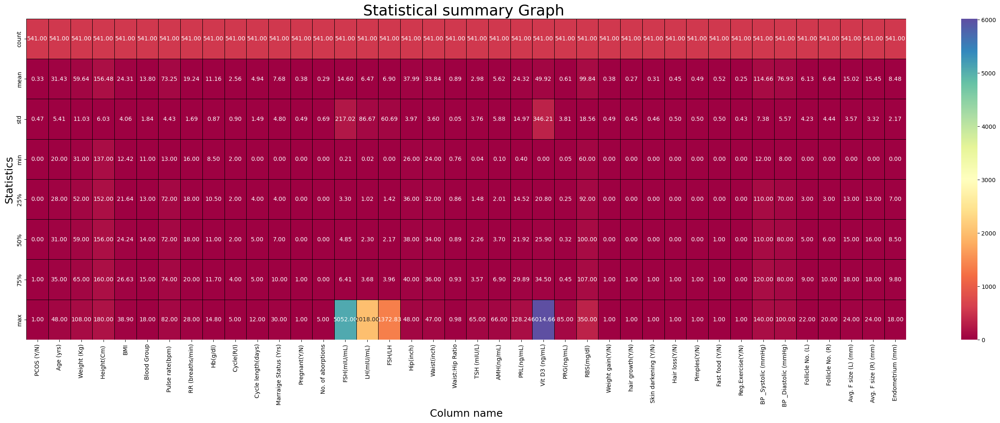

In [20]:
#using heatmap to check the summary of the dataset

plt.figure(figsize=(34,10))
sns.heatmap(pcos_df.describe(), annot = True, fmt='0.2f', linewidth=0.4, linecolor='black', cmap='Spectral')
plt.xlabel('Column name',fontsize=18)
plt.ylabel('Statistics', fontsize=18)
plt.title('Statistical summary Graph ',fontsize=26)
plt.show()

# Data visualization and EDA

visualization on the number of people with PCOS vs the number of people without

In [21]:
import plotly.graph_objects as go

labels = ['No PCOS', 'PCOS']
pcos_yes = pcos_df[pcos_df['PCOS (Y/N)'] == 1]
pcos_no = pcos_df[pcos_df['PCOS (Y/N)'] == 0]
values = [len(pcos_no), len(pcos_yes)]

# Create the pie chart
fig = go.Figure(data=[go.Pie(
    labels=labels, 
    values=values, 
    hole=.4, 
    marker=dict(colors=['green', 'purple']),
    textinfo='percent'
)])

# Update the layout
fig.update_layout(
    title_text="Analysis on PCOS"
)

# Show the figure
fig.show()


From the above pie chart we can conclude that in our dataset 67.3% (364) pepole are No Diabetes Person and 32.7% (177) are Diabetes Person.

 Age distribution of people with and without PCOS

In [22]:
import plotly.graph_objects as go
from scipy.stats import gaussian_kde



pcos_yes = pcos_df[" Age (yrs)"][pcos_df["PCOS (Y/N)"] == 1]
pcos_no = pcos_df[" Age (yrs)"][pcos_df["PCOS (Y/N)"] == 0]

# Compute KDE for pcos_yes and pcos_no
x_kde = np.linspace(min(min(pcos_yes), min(pcos_no)), max(max(pcos_yes), max(pcos_no)), 500)
kde_yes = gaussian_kde(pcos_yes)
kde_no = gaussian_kde(pcos_no)

# Create the figure
fig = go.Figure()

# Add histograms
fig.add_trace(go.Histogram(x=pcos_yes, name="Have PCOS", marker_color="purple", histnorm='probability density'))
fig.add_trace(go.Histogram(x=pcos_no, name="Don't have PCOS", marker_color="green", histnorm='probability density'))

# Add KDEs
fig.add_trace(go.Scatter(x=x_kde, y=kde_yes(x_kde), mode='lines', name='KDE - Have PCOS', line=dict(color='purple')))
fig.add_trace(go.Scatter(x=x_kde, y=kde_no(x_kde), mode='lines', name='KDE - Don\'t have PCOS', line=dict(color='green')))

# Add title and format axes
fig.update_layout(
    title="Age Distribution for people with and without PCOS",
    xaxis_title="Age",
    yaxis_title="Density",
    xaxis_showgrid=False,
    yaxis_gridcolor='#EEEEEE',
    xaxis_linecolor='#DDDDDD',
    yaxis_linecolor='#DDDDDD'
)

# Update layout to hide some axis lines
fig.update_xaxes(showline=True, linewidth=1, linecolor='#DDDDDD')
fig.update_yaxes(showline=False)

# Show the figure
fig.show()


Age group of PCOS is high on age 27 to 28

The spread of PCOS is going through all ages.

To confirm cycle length is affected by having PCOS

In [23]:
import plotly.graph_objects as go
from scipy.stats import gaussian_kde
import numpy as np

# Assuming you have pcos_df DataFrame defined
pcos_yes = pcos_df["Cycle length(days)"][pcos_df["PCOS (Y/N)"] == 1]
pcos_no = pcos_df["Cycle length(days)"][pcos_df["PCOS (Y/N)"] == 0]

# Compute KDE for pcos_yes and pcos_no
x_kde = np.linspace(min(min(pcos_yes), min(pcos_no)), max(max(pcos_yes), max(pcos_no)), 500)
kde_yes = gaussian_kde(pcos_yes)
kde_no = gaussian_kde(pcos_no)

# Create the figure
fig = go.Figure()

# Add histograms
fig.add_trace(go.Histogram(x=pcos_yes, name="Have PCOS", marker_color="purple", histnorm='probability density'))
fig.add_trace(go.Histogram(x=pcos_no, name="Don't have PCOS", marker_color="green", histnorm='probability density'))

# Add KDEs
fig.add_trace(go.Scatter(x=x_kde, y=kde_yes(x_kde), mode='lines', name='KDE - Have PCOS', line=dict(color='purple')))
fig.add_trace(go.Scatter(x=x_kde, y=kde_no(x_kde), mode='lines', name='KDE - Don\'t have PCOS', line=dict(color='green')))

# Add title and format axes
fig.update_layout(
    title="Cycle length for people with/without PCOS",
    xaxis_title="Cycle length (days)",
    yaxis_title="Density",
    xaxis_showgrid=False,
    yaxis_gridcolor='#EEEEEE',
    xaxis_linecolor='#DDDDDD',
    yaxis_linecolor='#DDDDDD'
)

# Update layout to hide some axis lines
fig.update_xaxes(showline=True, linewidth=1, linecolor='#DDDDDD')
fig.update_yaxes(showline=False)

# Show the figure
fig.show()


From the above we can see that people with PCOS are more likely to have shorter cycle days

Distribution of waist and hip measurements for people with/without PCOS

In [24]:
import plotly.graph_objects as go
import numpy as np
from scipy.stats import linregress


pcos_yes = pcos_df[pcos_df["PCOS (Y/N)"] == 1]
pcos_no = pcos_df[pcos_df["PCOS (Y/N)"] == 0]

# Linear regression for pcos_yes
slope_yes, intercept_yes, _, _, _ = linregress(pcos_yes["Waist(inch)"], pcos_yes["Hip(inch)"])
line_yes = slope_yes * np.array(pcos_yes["Waist(inch)"]) + intercept_yes

# Linear regression for pcos_no
slope_no, intercept_no, _, _, _ = linregress(pcos_no["Waist(inch)"], pcos_no["Hip(inch)"])
line_no = slope_no * np.array(pcos_no["Waist(inch)"]) + intercept_no

# Create the figure
fig = go.Figure()

# Add scatter plots
fig.add_trace(go.Scatter(x=pcos_yes["Waist(inch)"], y=pcos_yes["Hip(inch)"], mode='markers', name='Have PCOS', marker=dict(color='purple')))
fig.add_trace(go.Scatter(x=pcos_no["Waist(inch)"], y=pcos_no["Hip(inch)"], mode='markers', name="Don't have PCOS", marker=dict(color='green')))

# Add linear fit lines
fig.add_trace(go.Scatter(x=pcos_yes["Waist(inch)"], y=line_yes, mode='lines', name='Fit - Have PCOS', line=dict(color='purple')))
fig.add_trace(go.Scatter(x=pcos_no["Waist(inch)"], y=line_no, mode='lines', name='Fit - Don\'t have PCOS', line=dict(color='green')))

# Add title and labels
fig.update_layout(
    title='Linear Model Plot between Waist and Hip',
    xaxis_title='Waist (inch)',
    yaxis_title='Hip (inch)'
)

# Show the figure
fig.show()


In [25]:
import plotly.express as px

colour = ["green", "purple"]

fig = px.box(pcos_df, x="Weight gain(Y/N)", y="BMI", color="PCOS (Y/N)",
             color_discrete_map={0: colour[0], 1: colour[1]})
fig.update_layout(title_text="Box Plot of BMI vs. Weight Gain by PCOS Status")
fig.show()


From the above plot, we can say that there is higher chances of weight gain and high BMI for people with PCOS

In [26]:
# checking for outliers

import plotly.express as px

# Define the corrected sets of columns for the two violin plots
# Correct the column names based on the actual names in the dataset
columns_1 = [" Age (yrs)", "Weight (Kg)", "Height(Cm) ", "BMI", "Pulse rate(bpm) ", 
                       "RR (breaths/min)", "Hb(g/dl)", "Cycle length(days)", "Marraige Status (Yrs)", 
                       "No. of aborptions", "FSH(mIU/mL)", "LH(mIU/mL)", "FSH/LH"]

columns_2 = ["Hip(inch)", "Waist(inch)", "Waist:Hip Ratio", "TSH (mIU/L)", "AMH(ng/mL)", 
                       "PRL(ng/mL)", "Vit D3 (ng/mL)", "PRG(ng/mL)", "RBS(mg/dl)", "BP _Systolic (mmHg)", 
                       "BP _Diastolic (mmHg)", "Follicle No. (L)", "Follicle No. (R)", "Avg. F size (L) (mm)", 
                       "Avg. F size (R) (mm)", "Endometrium (mm)"]

# Create the first violin plot with corrected columns
fig1 = px.violin(pcos_df, y=columns_1, box=True, points="all")
fig1.update_layout(
    title="Violin Plot of Selected Columns 1",
    xaxis_title="Variables",
    yaxis_title="Values"
)

# Create the second violin plot with corrected columns
fig2 = px.violin(pcos_df, y=columns_2, box=True, points="all")
fig2.update_layout(
    title="Violin Plot of Selected Columns 2",
    xaxis_title="Variables",
    yaxis_title="Values"
)

# Show the plots
fig1.show()
fig2.show()



Removing outliers from health data could lead to the following:

Loss of Information: Outliers might carry valuable information. Extreme values in health data could represent rare but important medical conditions or events. Removing outliers may lead to an oversimplified and inaccurate representation of the true health landscape.

Biasing Results: Removing outliers can bias our analysis. If the outliers are not due to errors but instead represent genuine variations in the data, their removal can distort the statistical measures, relationships, and patterns in the data.

Misdiagnosis or Missed Insights: In the context of health data, outliers could indicate critical health conditions or outliers in treatment responses. By removing them, you might miss identifying potential outliers that require medical attention or insights into novel treatments.

Ethical Concerns: Outliers might include data from underrepresented or vulnerable populations. Removing them can inadvertently exacerbate health disparities and lead to biased conclusions.

Non-Normal Data: In health data, it's common for distributions to be skewed or not follow a normal distribution. Outliers can be an integral part of such distributions, and their removal can lead to the assumption of normality where it doesn't exist.

So therefore, we won't be removing outliers

In [27]:
# Checking value count for dependable dataset

pcos_df["PCOS (Y/N)"].value_counts()

0    364
1    177
Name: PCOS (Y/N), dtype: int64

In [28]:
# checking correlation between the variables and target? 

corr_pcos_df = pcos_df.corr(numeric_only=True)

corr_pcos_df

,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),...,Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
PCOS (Y/N),1.000000,-0.168513,0.211938,0.068254,0.199534,0.036433,0.091821,0.036928,0.087170,0.401644,...,0.286077,0.376183,0.065337,0.007942,0.038032,0.603346,0.648327,0.132992,0.097690,0.106648
Age (yrs),-0.168513,1.000000,-0.029734,-0.119819,0.021261,-0.010954,0.045831,0.087382,-0.021558,-0.085943,...,-0.032921,-0.039108,-0.025911,0.073587,0.066788,-0.110793,-0.159395,-0.016352,-0.079250,-0.104238
Weight (Kg),0.211938,-0.029734,1.000000,0.420098,0.901675,0.072682,0.019983,0.043614,0.009594,0.200758,...,0.063983,0.160774,-0.068236,0.027608,0.131402,0.173751,0.124290,-0.021368,-0.073207,-0.010100
Height(Cm),0.068254,-0.119819,0.420098,1.000000,-0.006878,0.040825,-0.074339,-0.029459,0.024378,-0.017336,...,0.061129,0.032839,0.012943,-0.067959,0.011116,0.106189,0.075358,-0.026705,0.059426,-0.054035
BMI,0.199534,0.021261,0.901675,-0.006878,1.000000,0.061939,0.050529,0.061905,0.003512,0.232828,...,0.045656,0.157726,-0.080192,0.069491,0.139975,0.142886,0.104204,-0.011610,-0.111522,0.009349
Blood Group,0.036433,-0.010954,0.072682,0.040825,0.061939,1.000000,0.047572,-0.023766,-0.001759,0.123724,...,0.039029,-0.035836,0.064035,0.030898,0.054014,0.061332,0.013974,-0.035667,-0.015725,-0.015335
Pulse rate(bpm),0.091821,0.045831,0.019983,-0.074339,0.050529,0.047572,1.000000,0.303804,-0.052048,0.101006,...,-0.003039,0.059242,-0.038881,-0.025510,0.007623,0.040390,0.049182,-0.048356,-0.034202,-0.041241
RR (breaths/min),0.036928,0.087382,0.043614,-0.029459,0.061905,-0.023766,0.303804,1.000000,-0.040487,0.018324,...,0.029242,0.137957,-0.047451,0.017323,0.052631,0.069731,0.012441,-0.031051,-0.021893,-0.063930
Hb(g/dl),0.087170,-0.021558,0.009594,0.024378,0.003512,-0.001759,-0.052048,-0.040487,1.000000,0.036683,...,0.053794,0.074818,0.011643,0.053020,0.000606,0.061195,0.072958,0.032617,0.024335,-0.066446
Cycle(R/I),0.401644,-0.085943,0.200758,-0.017336,0.232828,0.123724,0.101006,0.018324,0.036683,1.000000,...,0.121380,0.208263,-0.004989,0.054910,0.081345,0.296518,0.251575,0.033450,0.016007,0.043614


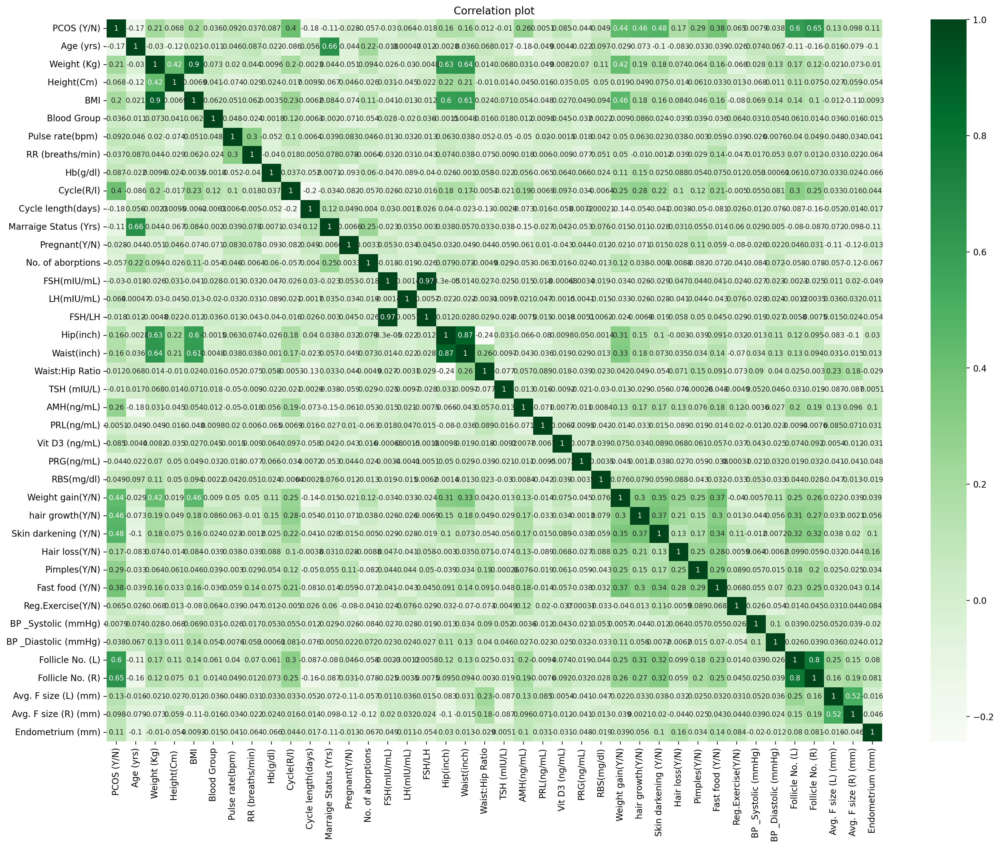

In [29]:
# heatmap visualization

# Set Jupyter Notebook settings for better display (optional and only for Jupyter Notebooks)
%config InlineBackend.figure_format='retina'

# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Generate the heatmap
plt.figure(figsize=(20,15))
sns.heatmap(corr_pcos_df, annot=True, cmap="Greens", annot_kws={"size": 8})
plt.title('Correlation plot', loc="center")
plt.show()


In [30]:
# how all the features correlate with PCOS 

corr_pcos_df["PCOS (Y/N)"].sort_values(ascending=False)

PCOS (Y/N)               1.000000
Follicle No. (R)         0.648327
Follicle No. (L)         0.603346
Skin darkening (Y/N)     0.475733
hair growth(Y/N)         0.464667
Weight gain(Y/N)         0.441047
Cycle(R/I)               0.401644
Fast food (Y/N)          0.376183
Pimples(Y/N)             0.286077
AMH(ng/mL)               0.264141
Weight (Kg)              0.211938
BMI                      0.199534
Hair loss(Y/N)           0.172879
Waist(inch)              0.164598
Hip(inch)                0.162297
Avg. F size (L) (mm)     0.132992
Endometrium (mm)         0.106648
Avg. F size (R) (mm)     0.097690
Pulse rate(bpm)          0.091821
Hb(g/dl)                 0.087170
Vit D3 (ng/mL)           0.085494
Height(Cm)               0.068254
Reg.Exercise(Y/N)        0.065337
LH(mIU/mL)               0.063879
RBS(mg/dl)               0.048922
BP _Diastolic (mmHg)     0.038032
RR (breaths/min)         0.036928
Blood Group              0.036433
Waist:Hip Ratio          0.012386
BP _Systolic (

In [31]:
corr_pcos_df["PCOS (Y/N)"].sort_values(ascending=False).head(15)

PCOS (Y/N)              1.000000
Follicle No. (R)        0.648327
Follicle No. (L)        0.603346
Skin darkening (Y/N)    0.475733
hair growth(Y/N)        0.464667
Weight gain(Y/N)        0.441047
Cycle(R/I)              0.401644
Fast food (Y/N)         0.376183
Pimples(Y/N)            0.286077
AMH(ng/mL)              0.264141
Weight (Kg)             0.211938
BMI                     0.199534
Hair loss(Y/N)          0.172879
Waist(inch)             0.164598
Hip(inch)               0.162297
Name: PCOS (Y/N), dtype: float64

Skewness of the data:
Weight (Kg)             0.515227
BMI                     0.269115
Cycle(R/I)              0.997662
Cycle length(days)      0.826791
Hip(inch)              -0.200873
Waist(inch)             0.194675
AMH(ng/mL)              3.297014
Follicle No. (L)        0.944619
Follicle No. (R)        0.785224
Endometrium (mm)        0.258766
Avg. F size (L) (mm)   -1.147341
dtype: float64


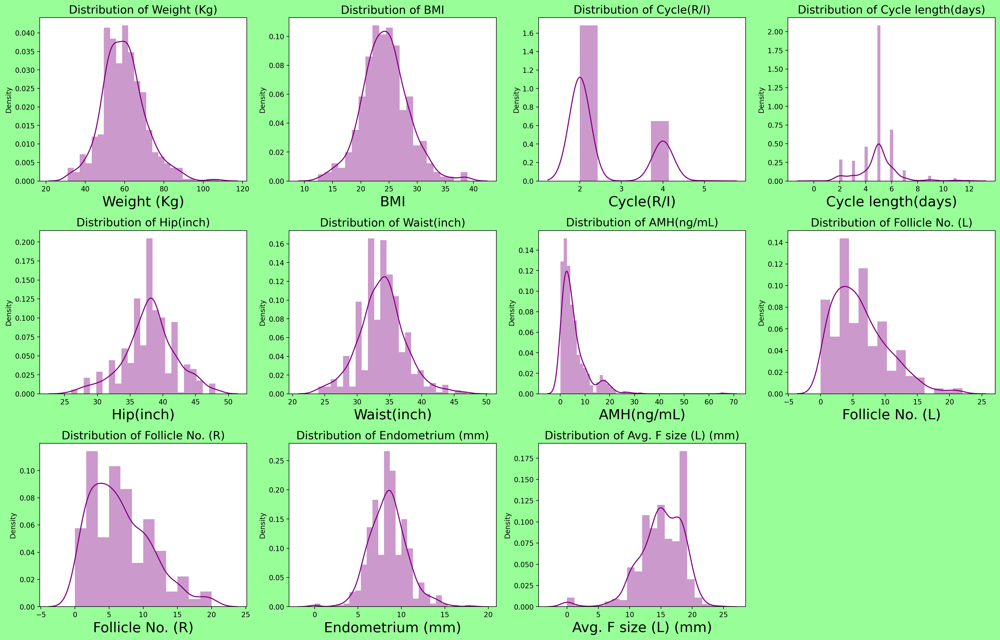

<Figure size 640x480 with 0 Axes>

In [32]:
# checking the skewness of the data

numerical_data = pcos_df[['Weight (Kg)', 'BMI', 
                     'Cycle(R/I)', 'Cycle length(days)', 
                     'Hip(inch)', 'Waist(inch)', 
                     'AMH(ng/mL)', 'Follicle No. (L)', 'Follicle No. (R)', 
                     'Endometrium (mm)', 'Avg. F size (L) (mm)']]
# Calculating the skewness of each column
skewness = numerical_data.skew()

# Printing the calculated skewness values
print("Skewness of the data:")
print(skewness)

# Configuring the figure format for better quality (optional)
%config InlineBackend.figure_format = 'retina'


plt.figure(figsize=(20, 25), facecolor='#98FF98')
plotnumber = 1

for column in numerical_data:
    if plotnumber <= 20:
        if numerical_data[column].dtype in ['int64', 'float64']:  # Check if the data type is numeric
            ax = plt.subplot(6, 4, plotnumber)
            sns.distplot(pcos_df[column], color='#800080')
            plt.xlabel(column, fontsize=20)
            plt.title(f'Distribution of {column}', fontsize=16)
        plotnumber += 1

plt.tight_layout()
plt.show()
# Removing the spines (axes lines) using Seaborn (optional)
sns.despine()

Here are some observations about skewness:

Columns like AMH(ng/mL), have extremely high skewness values, indicating that they are highly skewed.

Columns like Follicle No. (L) and Follicle No. (R) have moderately high skewness values, but still within range.

Most other columns have skewness values closer to zero, which suggests that they are approximately normally distributed.

Here's a general guideline on interpreting skewness:

A skewness value closer to 0 indicates that the data are fairly symmetrical.

A skewness value greater than 0 means that there is more weight in the right tail of the distribution (positively skewed).

A skewness value less than 0 means that there is more weight in the left tail of the distribution (negatively skewed).


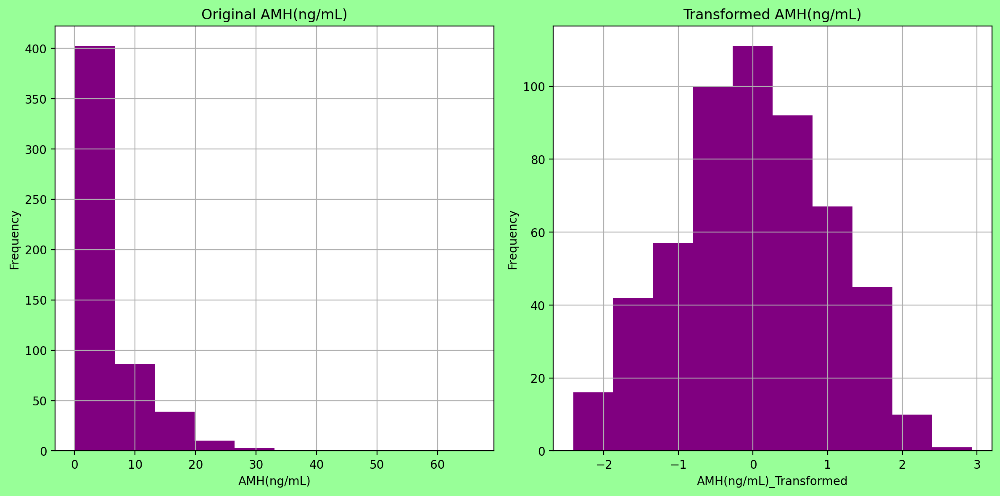

In [33]:
# Import necessary libraries for transformation and visualization
from sklearn.preprocessing import PowerTransformer
import matplotlib.pyplot as plt

# Extract the 'AMH(ng/mL)' column
amh_data = pcos_df[['AMH(ng/mL)']]

# Apply Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson')
amh_transformed = pt.fit_transform(amh_data)

# Create a DataFrame for the transformed data
amh_transformed_df = pd.DataFrame(amh_transformed, columns=['AMH(ng/mL)_Transformed'])

# Plot histograms for original and transformed data
fig, axes = plt.subplots(1, 2, figsize=(12, 6), facecolor='#98FF98')
amh_data.hist(ax=axes[0], color='#800080')
axes[0].set_title('Original AMH(ng/mL)')
axes[0].set_xlabel('AMH(ng/mL)')
axes[0].set_ylabel('Frequency')

amh_transformed_df.hist(ax=axes[1], color='#800080')
axes[1].set_title('Transformed AMH(ng/mL)')
axes[1].set_xlabel('AMH(ng/mL)_Transformed')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()



In [34]:
pcos_df.head()


,PCOS (Y/N),Age (yrs),Weight (Kg),Height(Cm),BMI,Blood Group,Pulse rate(bpm),RR (breaths/min),Hb(g/dl),Cycle(R/I),...,Pimples(Y/N),Fast food (Y/N),Reg.Exercise(Y/N),BP _Systolic (mmHg),BP _Diastolic (mmHg),Follicle No. (L),Follicle No. (R),Avg. F size (L) (mm),Avg. F size (R) (mm),Endometrium (mm)
0,0,28,44.6,152.0,19.300000,15,78,22,10.48,2,...,0,1.0,0,110,80,3,3,18.0,18.0,8.5
1,0,36,65.0,161.5,24.921163,15,74,20,11.70,2,...,0,0.0,0,120,70,3,5,15.0,14.0,3.7
2,1,33,68.8,165.0,25.270891,11,72,18,11.80,2,...,1,1.0,0,120,80,13,15,18.0,20.0,10.0
3,0,37,65.0,148.0,29.674945,13,72,20,12.00,2,...,0,0.0,0,120,70,2,2,15.0,14.0,7.5
4,0,25,52.0,161.0,20.060954,11,72,18,10.00,2,...,0,0.0,0,120,80,3,4,16.0,14.0,7.0


In [35]:
# Add the transformed 'AMH(ng/mL)' column back to the main dataset

pcos_df['AMH(ng/mL)_Transformed'] = amh_transformed_df

# Model building

the top 15 highly correlated columns will be used for the independent variable

In [36]:
# getting the independant and dependant variable 

x = pcos_df[["Follicle No. (R)", "Follicle No. (L)", "Skin darkening (Y/N)", 
               "hair growth(Y/N)", "Weight gain(Y/N)", "Cycle(R/I)", "Fast food (Y/N)", "Pimples(Y/N)", "AMH(ng/mL)_Transformed", "Weight (Kg)", "BMI", 
               "Hair loss(Y/N)", "Waist(inch)", "Hip(inch)", "Avg. F size (L) (mm)"]] 

# Display the first few rows of X confirm
x.head()

,Follicle No. (R),Follicle No. (L),Skin darkening (Y/N),hair growth(Y/N),Weight gain(Y/N),Cycle(R/I),Fast food (Y/N),Pimples(Y/N),AMH(ng/mL)_Transformed,Weight (Kg),BMI,Hair loss(Y/N),Waist(inch),Hip(inch),Avg. F size (L) (mm)
0,3,3,0,0,0,2,1.0,0,-0.654768,44.6,19.300000,0,30,36,18.0
1,5,3,0,0,0,2,0.0,0,-0.959058,65.0,24.921163,0,32,38,15.0
2,15,13,0,0,0,2,1.0,1,0.634009,68.8,25.270891,1,36,40,18.0
3,2,2,0,0,0,2,0.0,0,-1.171186,65.0,29.674945,0,36,42,15.0
4,4,3,0,0,0,2,0.0,0,-0.562605,52.0,20.060954,1,30,37,16.0


In [37]:

y = pcos_df.iloc[:, 0]

# Display the first few rows of y confirm
y.head()

0    0
1    0
2    1
3    0
4    0
Name: PCOS (Y/N), dtype: int64

In [38]:
# split the data into training and testing set

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.25, random_state = 42)

In [39]:
# standardisation 
## input data is transformed to have a mean of 0 and variance of 1 
## dont fit x_test only transform so no overfitting 

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

x_train = scaler.fit_transform(x_train)

x_test = scaler.transform(x_test)

In [40]:
# oversampling using the SMOTE (Synthetic Minority Over-sampling Technique) method due to the imbalanced nature of the dependent variable
# an imbalance class creates a bias where the machine learning model tends to predict the majority class. 
#SMOTE generates synthetic samples by interpolating between instances.

import imblearn
from imblearn.over_sampling import SMOTE

smote = SMOTE()

x_train_sm, y_trained_sm = smote.fit_resample(x_train, y_train)
#x_resampled, y_resampled = smote.fit_resample(x, y)


In [41]:
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import confusion_matrix, accuracy_score
from mlxtend.plotting import plot_confusion_matrix
from plotly.subplots import make_subplots


In [42]:
accuracy_list = []

# logistic regression

In [43]:
# logistic regression

LR = LogisticRegression()
LR.fit(x_train, y_train)
LR_pred = LR.predict(x_test)

# evaluate the model accuracy
LR_acc = accuracy_score(y_test, LR_pred)
accuracy_list.append(100*LR_acc)

print("Accuracy of Logistic Regression is : ", "{:.2f}%".format(100* LR_acc))


Accuracy of Logistic Regression is :  89.71%


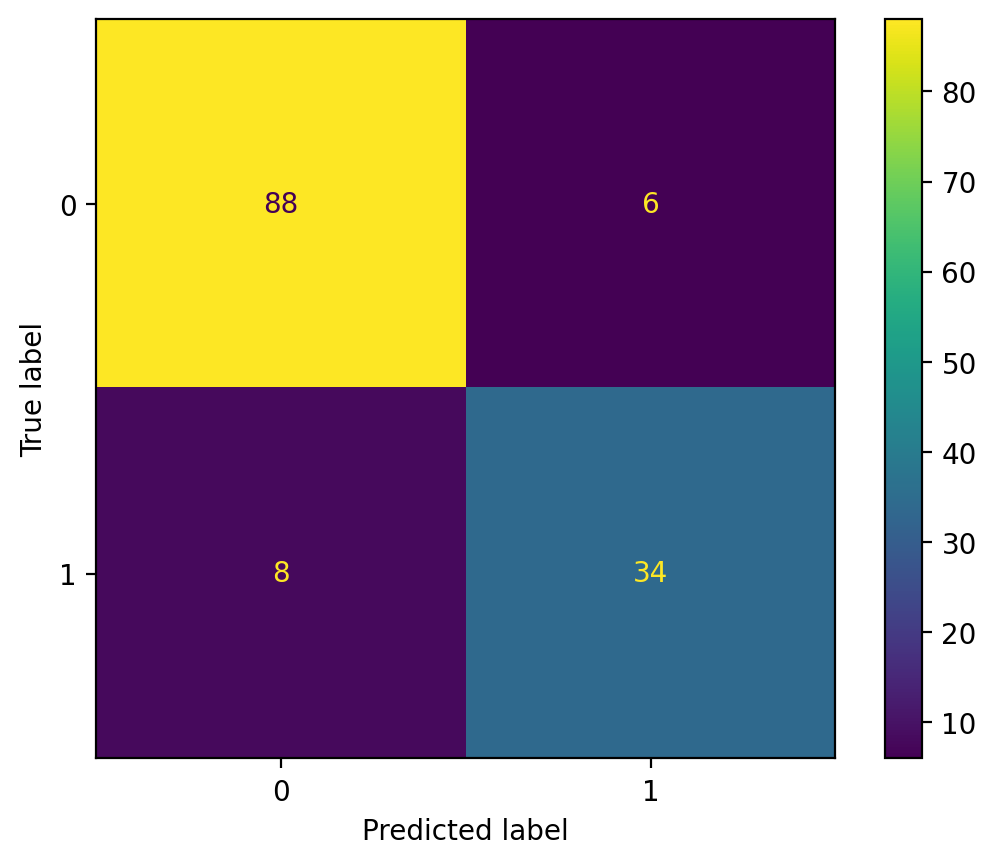

In [44]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for your logistic regression predictions
cm = confusion_matrix(y_test, LR_pred, labels=LR.classes_)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=LR.classes_)

disp.plot()


In [45]:
# get the result in a dataframe 

L_reg = {"Actual":y_test, "Predicted": LR_pred}
L_reg_df = pd.DataFrame(L_reg)
L_reg_df

,Actual,Predicted
229,0,0
73,0,0
352,1,0
86,0,0
470,1,1
...,...,...
380,0,0
204,0,0
172,0,0
211,1,1


In [46]:
# classification report

print(classification_report(y_test, LR_pred))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93        94
           1       0.85      0.81      0.83        42

    accuracy                           0.90       136
   macro avg       0.88      0.87      0.88       136
weighted avg       0.90      0.90      0.90       136



AUC: 0.87
AUC: 87.28%


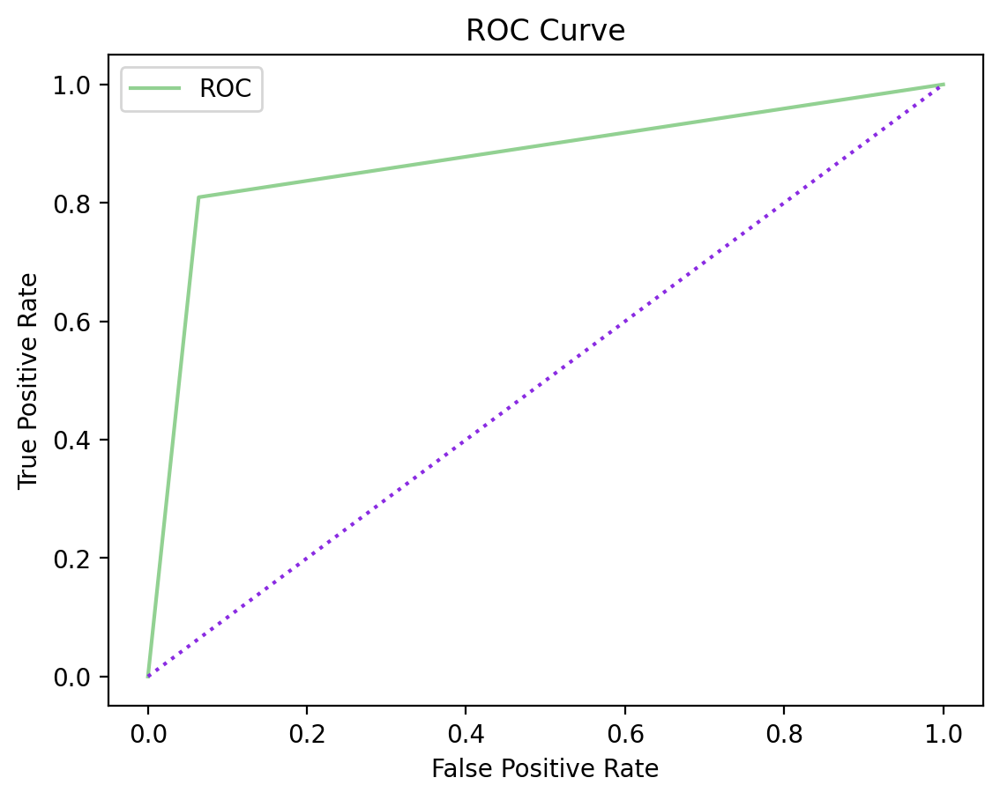

In [47]:
# roc curve
auc_cv = roc_auc_score(y_test, LR_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, LR_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# K Neighbors

In [48]:
# K Neighbors Classifier

KNN = KNeighborsClassifier(n_neighbors=5)
KNN.fit(x_train, y_train)

# make prediction
KNN_pred = KNN.predict(x_test)

# evaluate the model accuracy
KNN_acc = accuracy_score(y_test, KNN_pred)
accuracy_list.append(100*KNN_acc)

print("Accuracy of K Neighbors is : ", "{:.2f}%".format(100* KNN_acc))


Accuracy of K Neighbors is :  85.29%


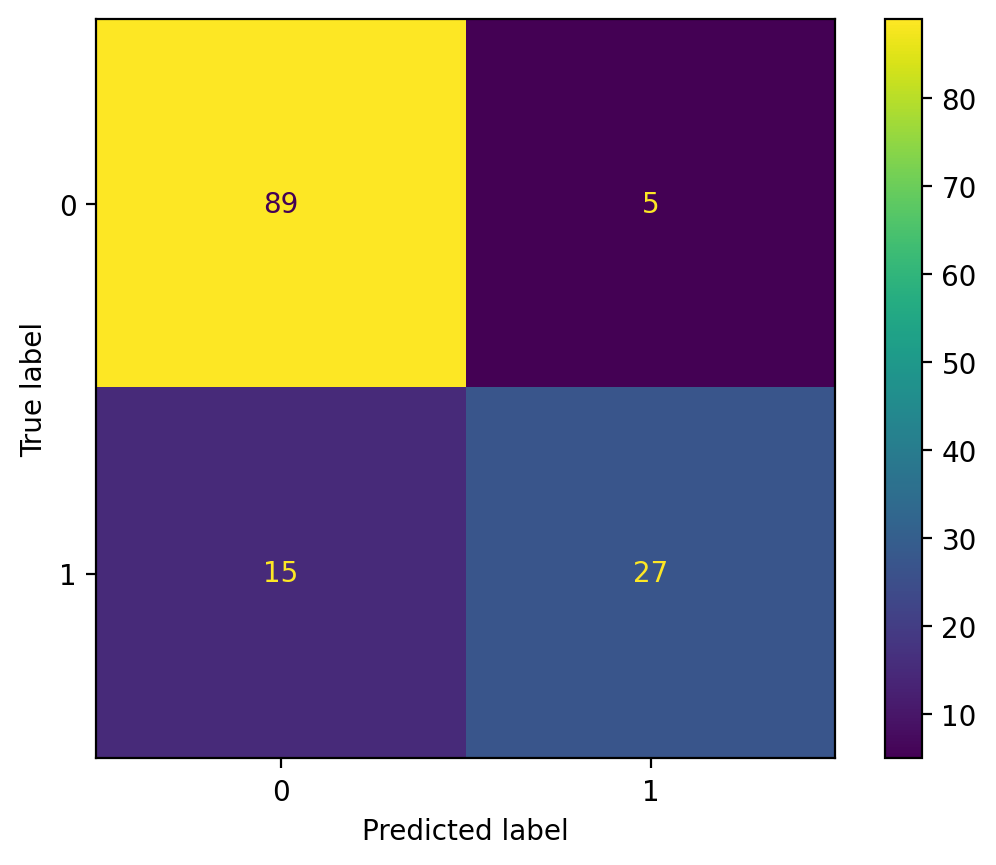

In [49]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for K Neighbors predictions
cm_KNN = confusion_matrix(y_test, KNN_pred, labels=KNN.classes_)

disp_KNN = ConfusionMatrixDisplay(confusion_matrix=cm_KNN, display_labels=KNN.classes_)

disp_KNN.plot()

In [50]:
# get the result in a dataframe 

Knn = {"Actual":y_test, "Predicted": KNN_pred}
Knn_df = pd.DataFrame(Knn)
Knn_df

,Actual,Predicted
229,0,0
73,0,0
352,1,0
86,0,0
470,1,1
...,...,...
380,0,0
204,0,0
172,0,0
211,1,1


In [51]:
# classification report

print(classification_report(y_test, KNN_pred))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90        94
           1       0.84      0.64      0.73        42

    accuracy                           0.85       136
   macro avg       0.85      0.79      0.81       136
weighted avg       0.85      0.85      0.85       136



AUC: 0.79
AUC: 79.48%


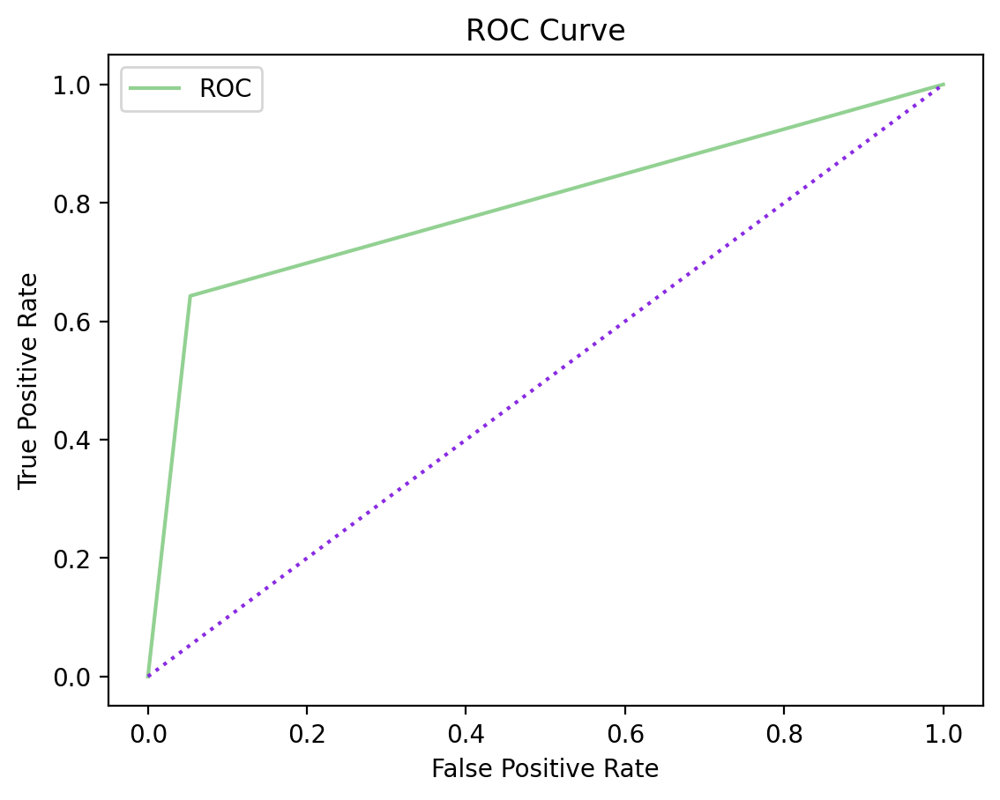

In [52]:
# roc curve
auc_cv = roc_auc_score(y_test, KNN_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, KNN_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Naive bayes gaussian

In [53]:
# Naive bayes gaussian Classifier

GNB = GaussianNB()
GNB.fit(x_train, y_train)

# make prediction
GNB_pred = GNB.predict(x_test)

# evaluate the model accuracy
GNB_acc = accuracy_score(y_test, GNB_pred)
accuracy_list.append(100*GNB_acc)

print("Accuracy of naive bayes gaussian is : ", "{:.2f}%".format(100* GNB_acc))


Accuracy of naive bayes gaussian is :  88.24%


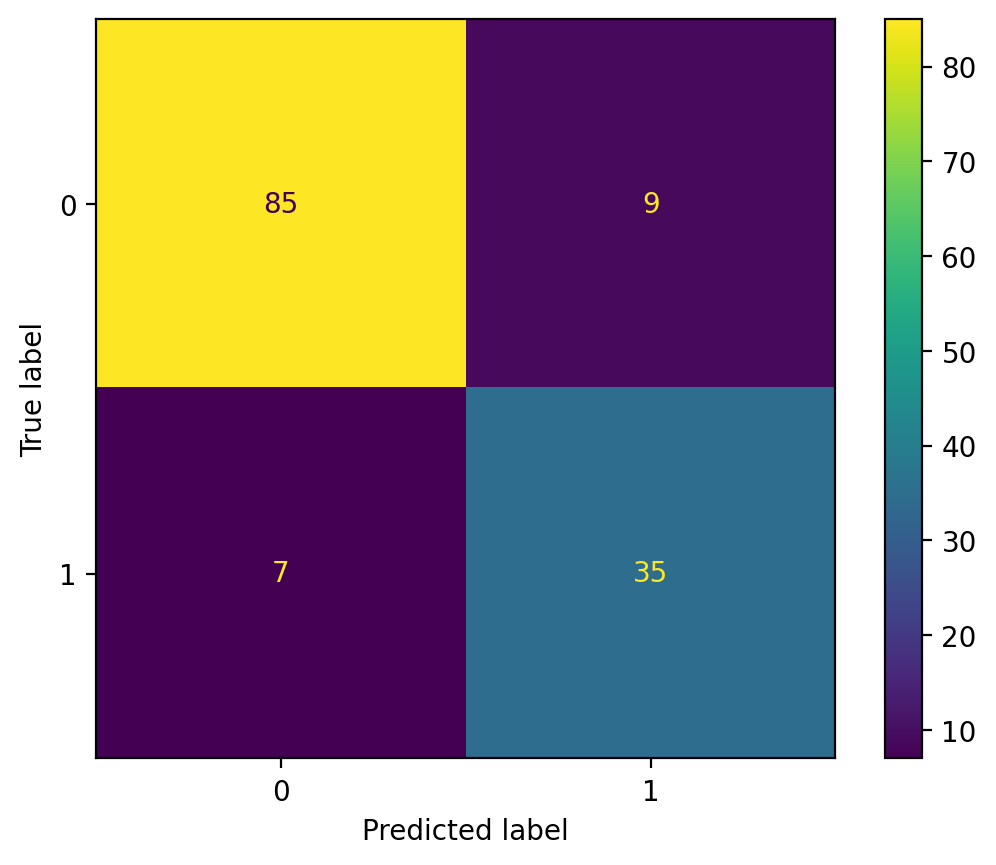

In [54]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for Naive bayes gaussian predictions
cm_GNB = confusion_matrix(y_test, GNB_pred, labels=GNB.classes_)

disp_GNB = ConfusionMatrixDisplay(confusion_matrix=cm_GNB, display_labels=GNB.classes_)

disp_GNB.plot()

In [55]:
# classification report

print(classification_report(y_test, GNB_pred))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91        94
           1       0.80      0.83      0.81        42

    accuracy                           0.88       136
   macro avg       0.86      0.87      0.86       136
weighted avg       0.88      0.88      0.88       136



AUC: 0.87
AUC: 86.88%


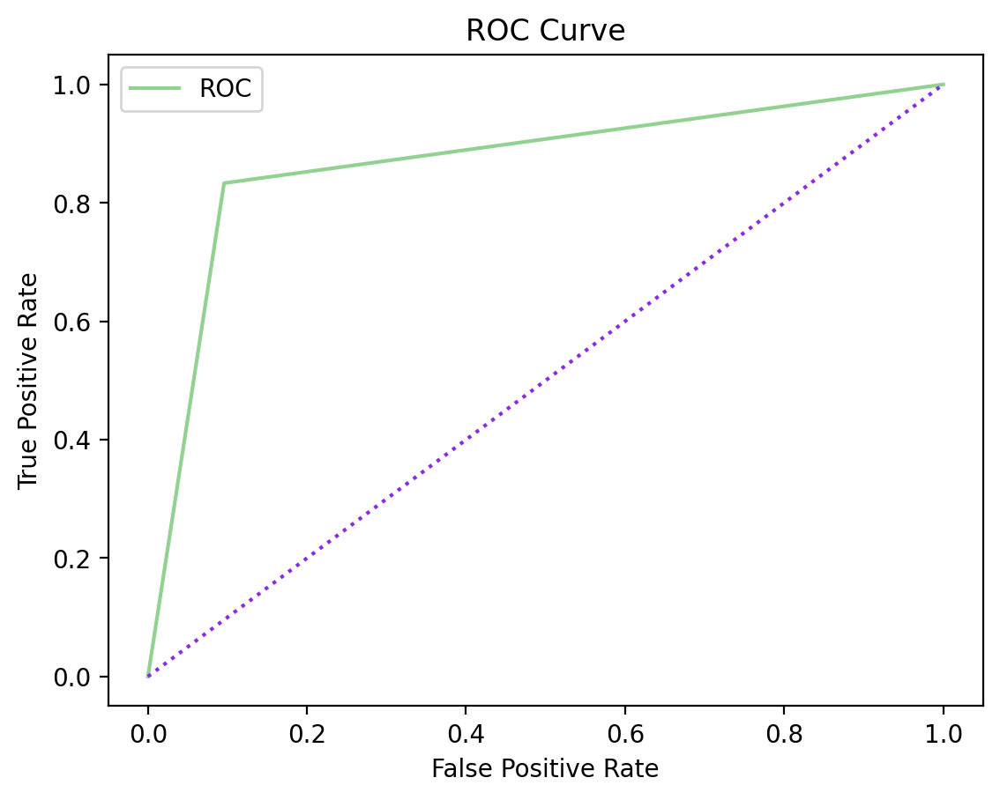

In [56]:
# roc curve
auc_cv = roc_auc_score(y_test, GNB_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, GNB_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Support Vector

In [57]:
# svc

SVC_model = SVC()
SVC_model.fit(x_train, y_train)

# make prediction
SVC_pred = SVC_model.predict(x_test)

# evaluate the model accuracy
SVC_acc = accuracy_score(y_test, SVC_pred)
accuracy_list.append(100*SVC_acc)

print("Accuracy of Naive bayes gaussian is : ", "{:.2f}%".format(100* SVC_acc))


Accuracy of Naive bayes gaussian is :  88.24%


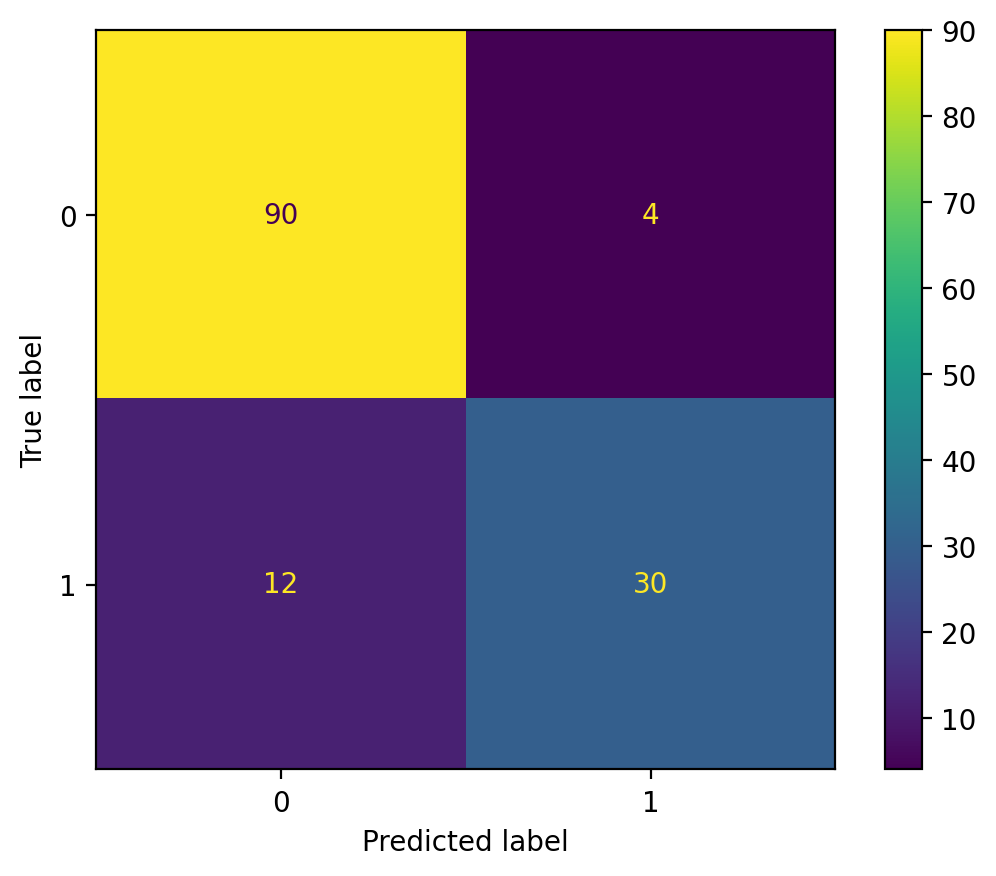

In [58]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for svc predictions
cm_SVC = confusion_matrix(y_test, SVC_pred, labels=SVC_model.classes_)

disp_SVC = ConfusionMatrixDisplay(confusion_matrix=cm_SVC, display_labels=SVC_model.classes_)

disp_SVC.plot()

In [59]:
# classification report

print(classification_report(y_test, SVC_pred))

              precision    recall  f1-score   support

           0       0.88      0.96      0.92        94
           1       0.88      0.71      0.79        42

    accuracy                           0.88       136
   macro avg       0.88      0.84      0.85       136
weighted avg       0.88      0.88      0.88       136



AUC: 0.84
AUC: 83.59%


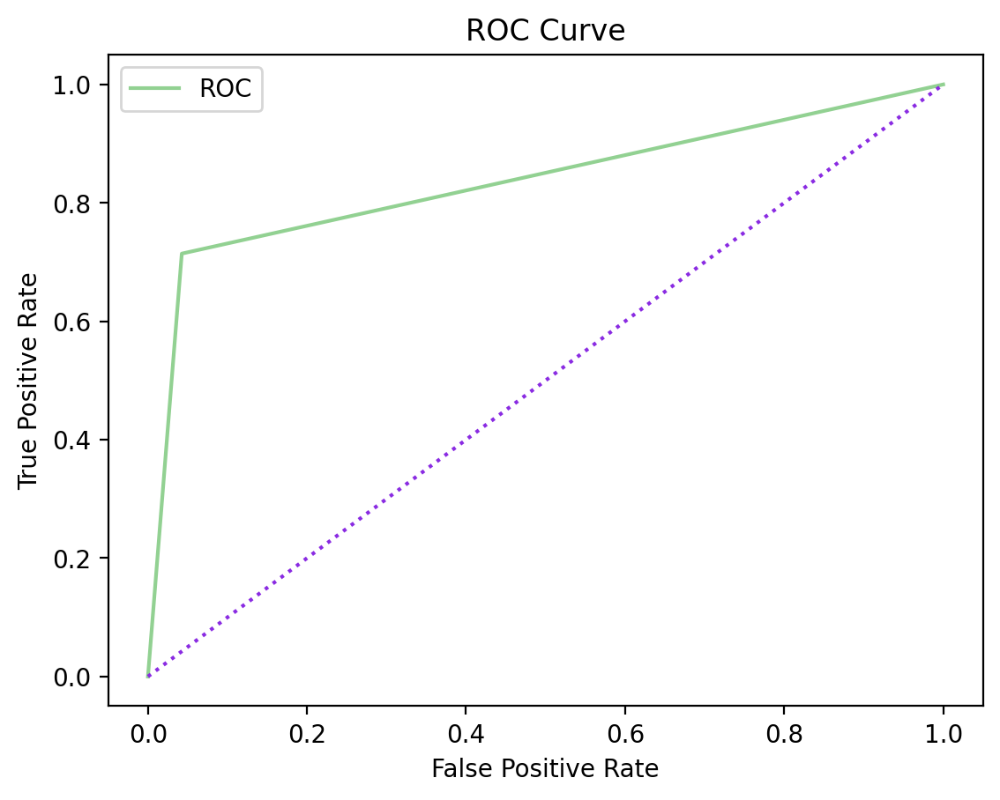

In [60]:
# roc curve
auc_cv = roc_auc_score(y_test, SVC_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, SVC_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Decision Tree

In [61]:
# Decision Tree Classifier

DT_model = DecisionTreeClassifier(max_leaf_nodes=5, random_state=42, criterion='gini')
DT_model.fit(x_train, y_train)

# make prediction
DT_pred = DT_model.predict(x_test)

# evaluate the model accuracy
DT_acc = accuracy_score(y_test, DT_pred)
accuracy_list.append(100*DT_acc)

print("Accuracy of Decision Tree is : ", "{:.2f}%".format(100* DT_acc))


Accuracy of Decision Tree is :  83.82%


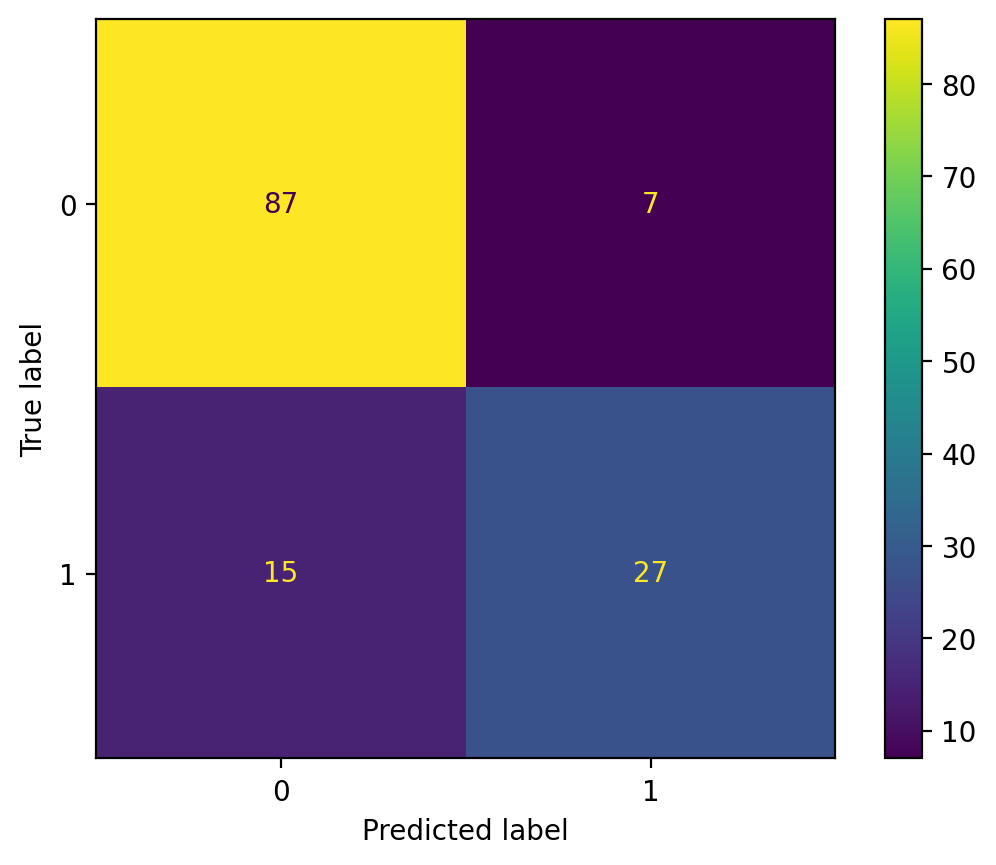

In [62]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for your Decision Tree  predictions
cm_DT = confusion_matrix(y_test, DT_pred, labels=DT_model.classes_)

disp_DT = ConfusionMatrixDisplay(confusion_matrix=cm_DT, display_labels=DT_model.classes_)

disp_DT.plot()

In [63]:
# classification report

print(classification_report(y_test, DT_pred))

              precision    recall  f1-score   support

           0       0.85      0.93      0.89        94
           1       0.79      0.64      0.71        42

    accuracy                           0.84       136
   macro avg       0.82      0.78      0.80       136
weighted avg       0.83      0.84      0.83       136



AUC: 0.78
AUC: 78.42%


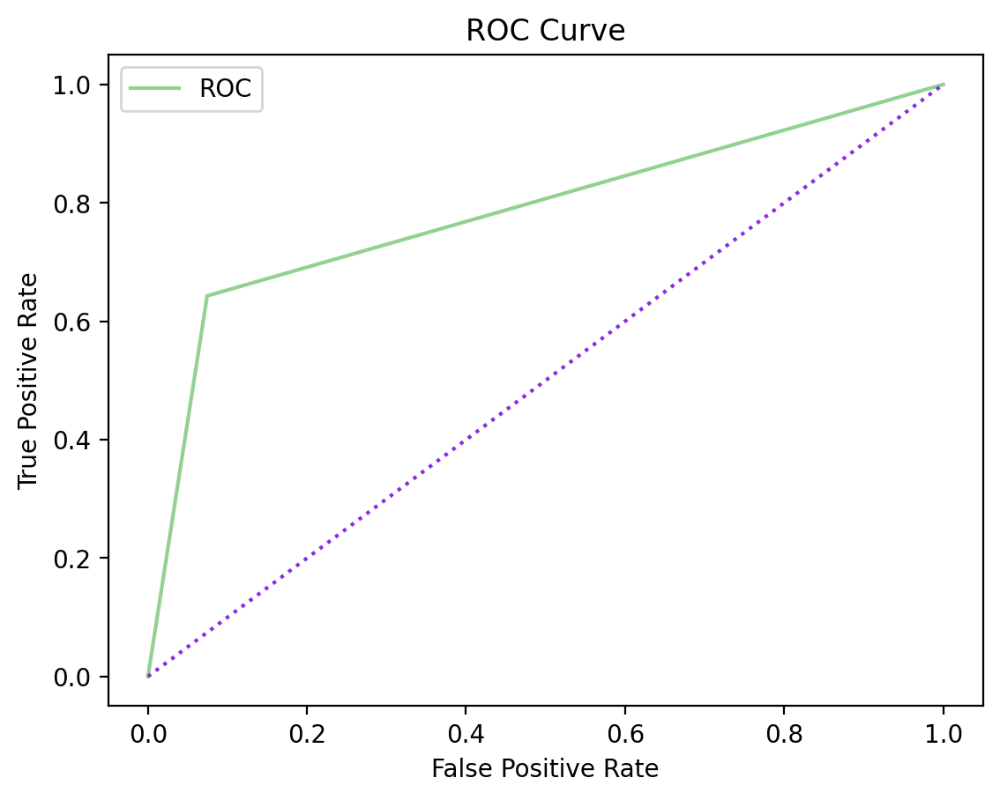

In [64]:
# roc curve
auc_cv = roc_auc_score(y_test, DT_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, DT_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Random Forest

In [65]:
# RandomForest Classifier

RF_model = RandomForestClassifier(max_features=0.5, random_state=42)
RF_model.fit(x_train, y_train)

# make prediction
RF_pred = RF_model.predict(x_test)

# evaluate the model accuracy
RF_acc = accuracy_score(y_test, RF_pred)
accuracy_list.append(100*RF_acc)

print("Accuracy of RandomForest is : ", "{:.2f}%".format(100* RF_acc))



Accuracy of RandomForest is :  88.97%


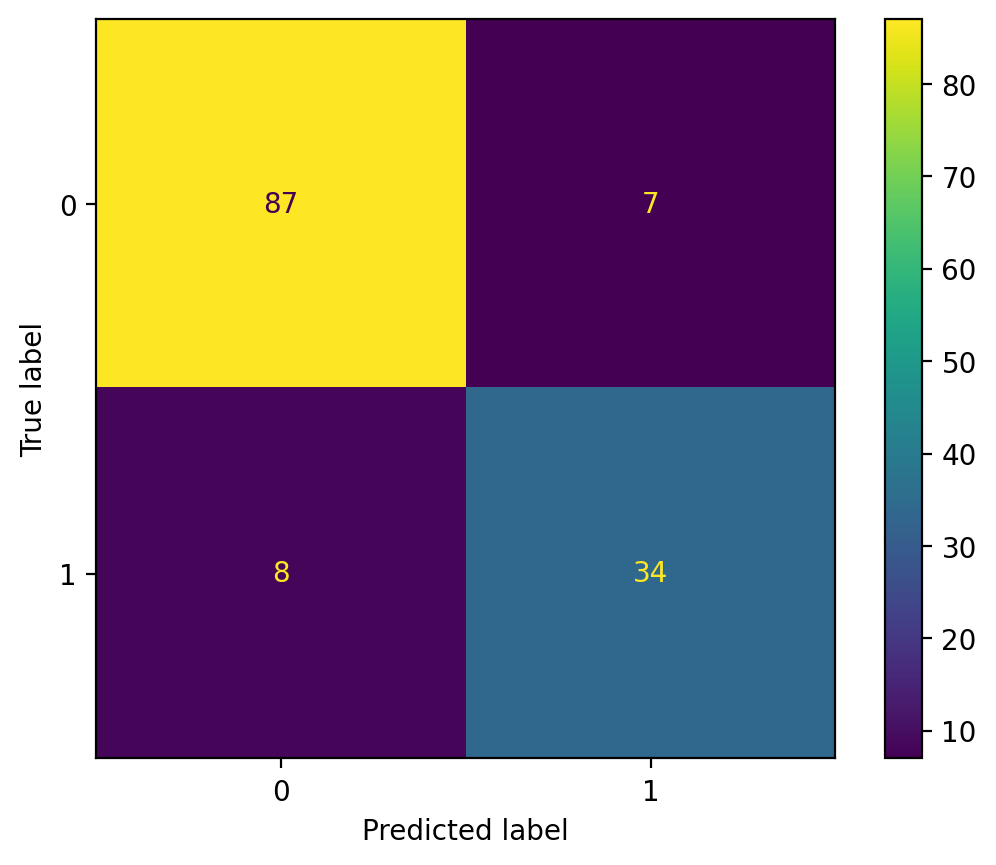

In [66]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for RandomForest predictions

cm_RF = confusion_matrix(y_test, RF_pred, labels=RF_model.classes_)

disp_RF = ConfusionMatrixDisplay(confusion_matrix=cm_RF, display_labels=RF_model.classes_)

disp_RF.plot()

In [67]:
# classification report

print(classification_report(y_test, RF_pred))

              precision    recall  f1-score   support

           0       0.92      0.93      0.92        94
           1       0.83      0.81      0.82        42

    accuracy                           0.89       136
   macro avg       0.87      0.87      0.87       136
weighted avg       0.89      0.89      0.89       136



AUC: 0.87
AUC: 86.75%


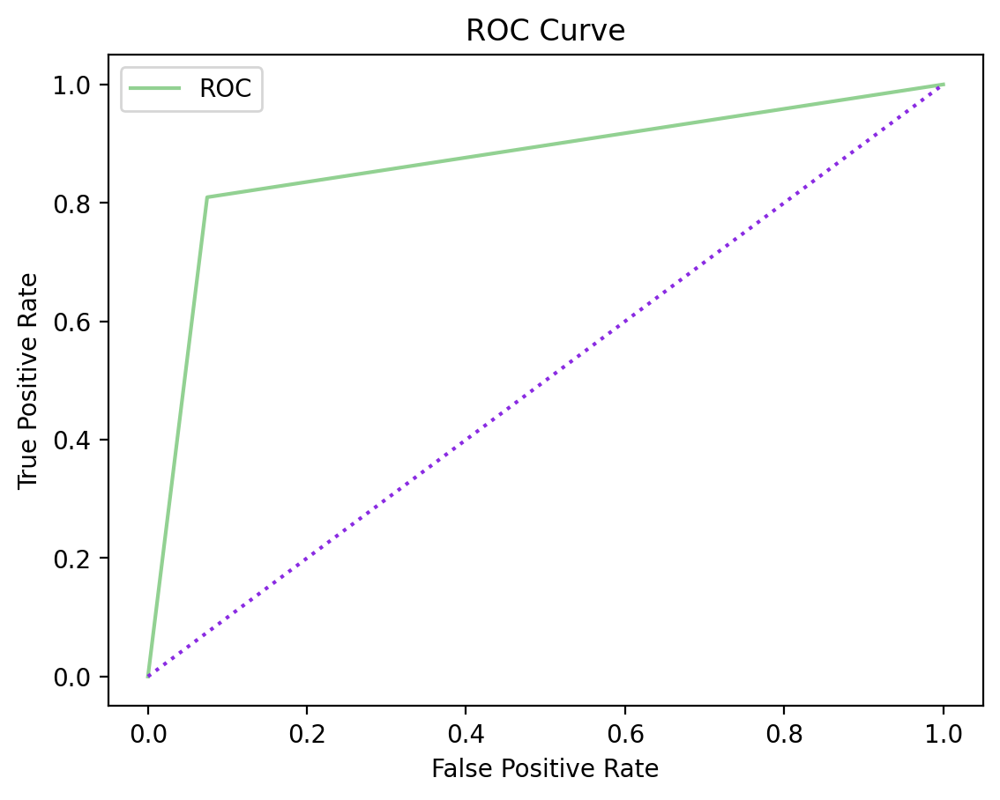

In [68]:
# roc curve
auc_cv = roc_auc_score(y_test, RF_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, RF_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# CatBoost

In [69]:


CB_model = CatBoostClassifier()
CB_model.fit(x_train, y_train)

# make prediction
CB_pred = CB_model.predict(x_test)

# evaluate the model accuracy
CB_acc = accuracy_score(y_test, CB_pred)
accuracy_list.append(100*CB_acc)

print("Accuracy of CatBoost is : ", "{:.2f}%".format(100* CB_acc))


Learning rate set to 0.007004
0:	learn: 0.6875076	total: 131ms	remaining: 2m 10s
1:	learn: 0.6798408	total: 137ms	remaining: 1m 8s
2:	learn: 0.6738320	total: 144ms	remaining: 47.8s
3:	learn: 0.6682460	total: 151ms	remaining: 37.5s
4:	learn: 0.6606798	total: 158ms	remaining: 31.4s
5:	learn: 0.6546990	total: 163ms	remaining: 27.1s
6:	learn: 0.6478554	total: 170ms	remaining: 24.1s
7:	learn: 0.6412853	total: 176ms	remaining: 21.8s
8:	learn: 0.6347377	total: 183ms	remaining: 20.1s
9:	learn: 0.6298334	total: 187ms	remaining: 18.5s
10:	learn: 0.6260211	total: 190ms	remaining: 17.1s
11:	learn: 0.6192236	total: 195ms	remaining: 16s
12:	learn: 0.6139828	total: 199ms	remaining: 15.1s
13:	learn: 0.6085361	total: 202ms	remaining: 14.2s
14:	learn: 0.6035371	total: 206ms	remaining: 13.5s
15:	learn: 0.5981679	total: 209ms	remaining: 12.8s
16:	learn: 0.5930647	total: 212ms	remaining: 12.3s
17:	learn: 0.5871076	total: 215ms	remaining: 11.7s
18:	learn: 0.5834877	total: 218ms	remaining: 11.3s
19:	learn: 0

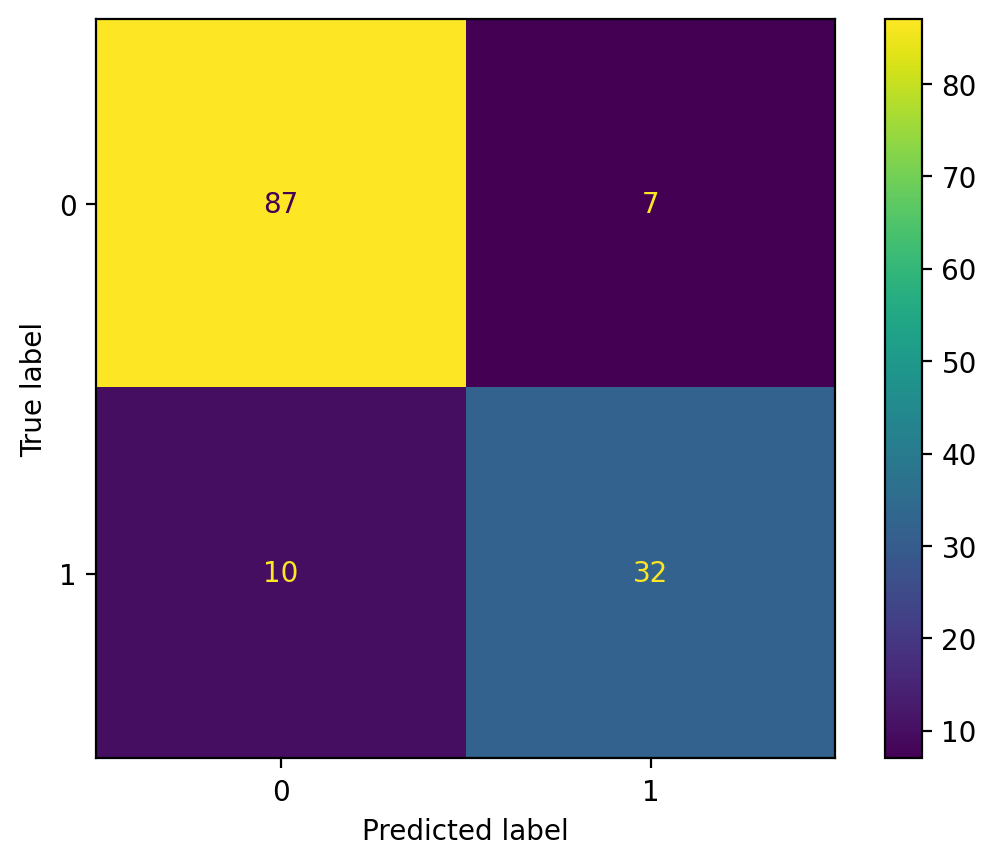

In [70]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for your CatBoost predictions

cm_CB = confusion_matrix(y_test, CB_pred, labels=CB_model.classes_)

disp_CB = ConfusionMatrixDisplay(confusion_matrix=cm_CB, display_labels=CB_model.classes_)

disp_CB.plot()

In [71]:
# classification report

print(classification_report(y_test, CB_pred))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91        94
           1       0.82      0.76      0.79        42

    accuracy                           0.88       136
   macro avg       0.86      0.84      0.85       136
weighted avg       0.87      0.88      0.87       136



AUC: 0.84
AUC: 84.37%


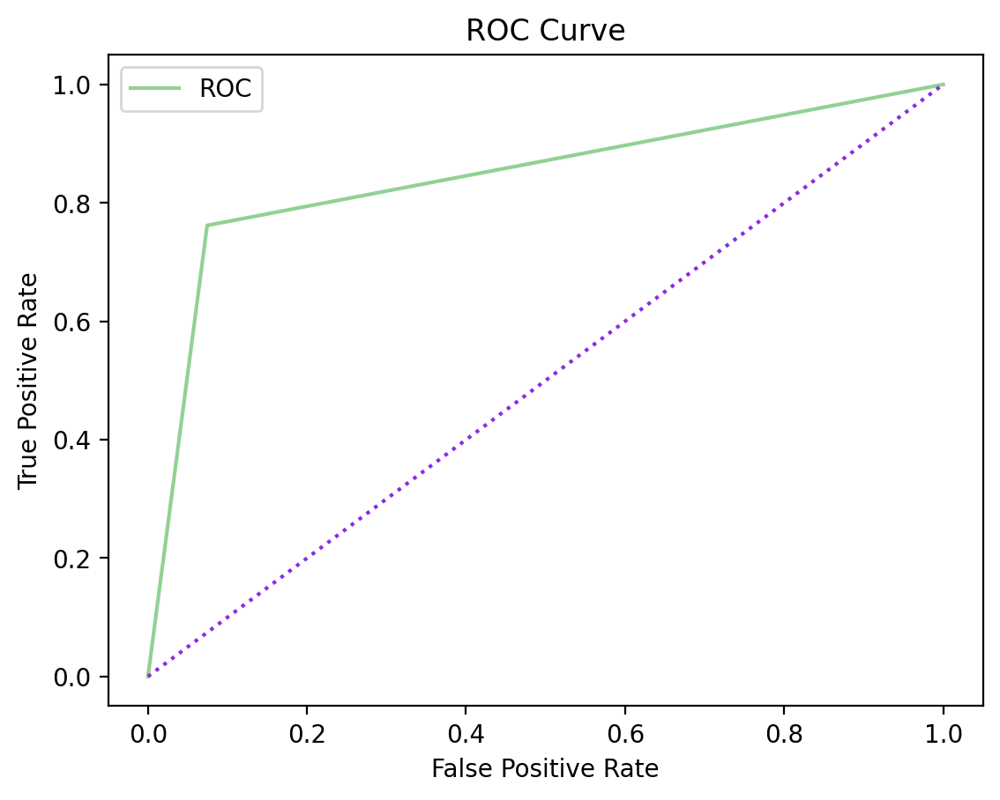

In [72]:
# roc curve
auc_cv = roc_auc_score(y_test, CB_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, CB_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Gradient Boosting 

In [73]:
# GradientBoosting Classifier

GB_model = GradientBoostingClassifier(max_depth=2, random_state=42)
GB_model.fit(x_train, y_train)

# make prediction
GB_pred = GB_model.predict(x_test)

# evaluate the model accuracy
GB_acc = accuracy_score(y_test, GB_pred)
accuracy_list.append(100*GB_acc)

print("Accuracy of GradientBoosting is : ", "{:.2f}%".format(100* GB_acc))



Accuracy of GradientBoosting is :  87.50%


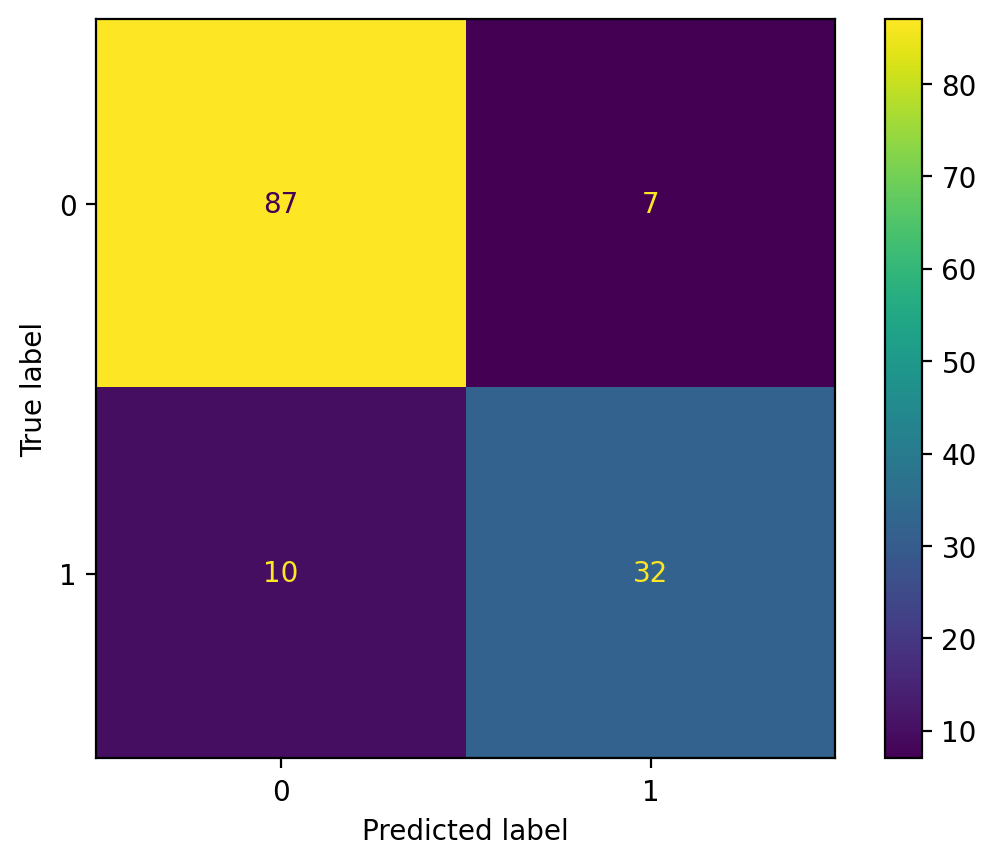

In [74]:
# CONFUSION MATRIX

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calculate the confusion matrix for GradientBoosting predictions

cm_GB = confusion_matrix(y_test, GB_pred, labels=GB_model.classes_)

disp_GB = ConfusionMatrixDisplay(confusion_matrix=cm_GB, display_labels=GB_model.classes_)

disp_GB.plot()

In [75]:
# classification report

print(classification_report(y_test, GB_pred))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91        94
           1       0.82      0.76      0.79        42

    accuracy                           0.88       136
   macro avg       0.86      0.84      0.85       136
weighted avg       0.87      0.88      0.87       136



AUC: 0.84
AUC: 84.37%


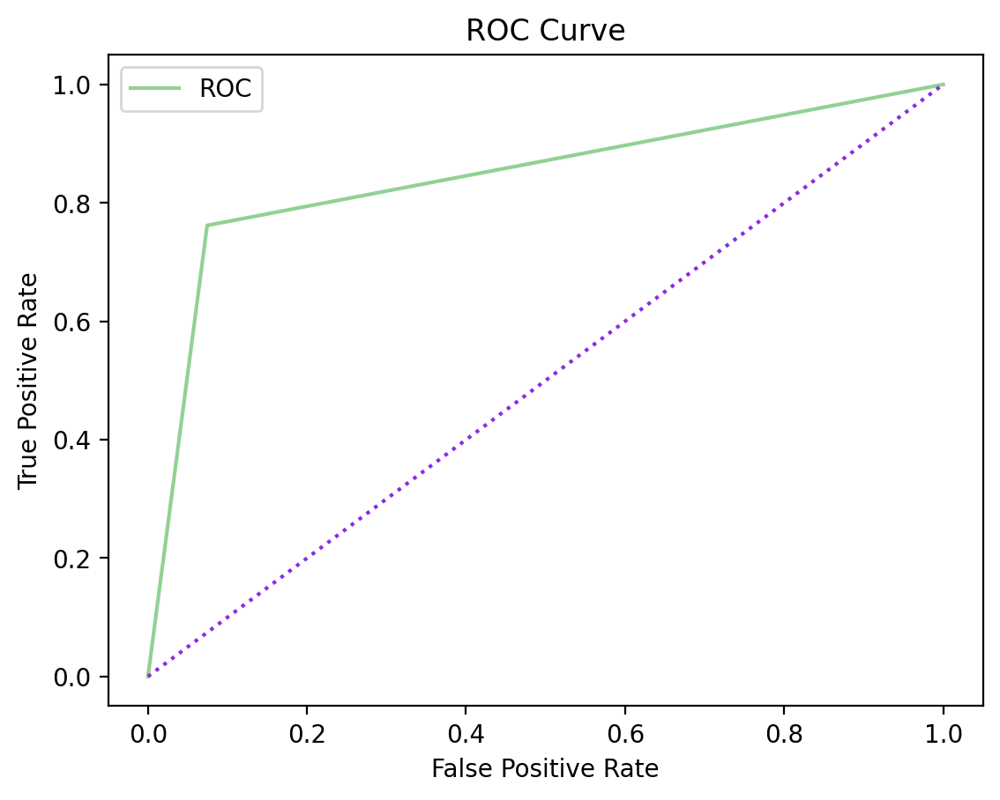

In [76]:
# roc curve
auc_cv = roc_auc_score(y_test, GB_pred)

# To two decimal place
print('AUC: %.2f' %auc_cv)

# In percentage
print('AUC: %.2f%%' % (auc_cv * 100))



fpr, tpr, _ = roc_curve(y_test, GB_pred)
plt.plot(fpr, tpr, color='#92d192', label='ROC')
plt.plot([0, 1], [0, 1], color='#8a2be2', linestyle=':')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [77]:
models = ['LogisticRegression', 'SVC','KNearestNeighbours', 'DecisionTree', 'RandomForest',
              'GradientBooster', 'CatBoostClassifier', 'GaussianNB']

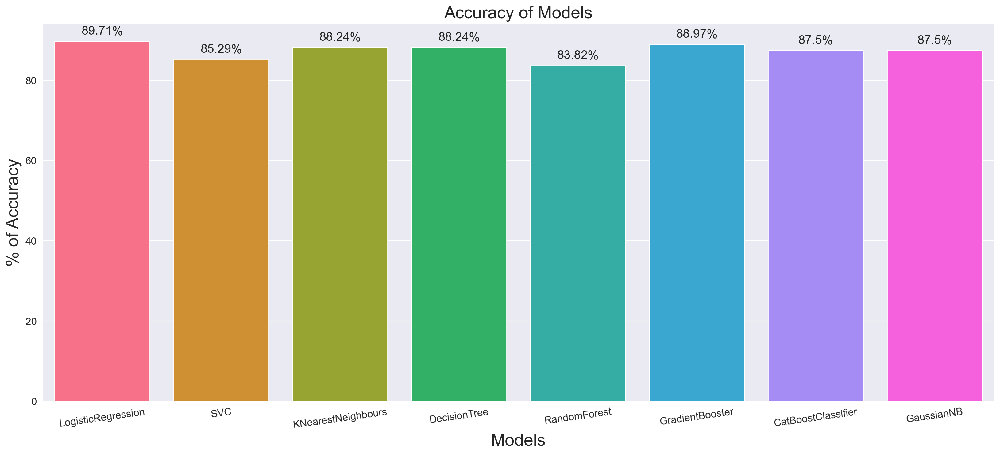

In [78]:
plt.rcParams['figure.figsize']=20,8
sns.set_style('darkgrid')
ax = sns.barplot(x=models, y=accuracy_list, palette = "husl", saturation =2.0)
plt.xlabel('Models', fontsize = 20 )
plt.ylabel('% of Accuracy', fontsize = 20)
plt.title('Accuracy of Models', fontsize = 20)
plt.xticks(fontsize = 12, horizontalalignment = 'center', rotation = 8)
plt.yticks(fontsize = 12)
for i in ax.patches:
    width, height = i.get_width(), i.get_height()
    x, y = i.get_xy() 
    ax.annotate(f'{round(height,2)}%', (x + width/2, y + height*1.02), ha='center', fontsize = 'x-large')
plt.show()

# Observations:

Logistic Regression: Achieved an accuracy of approximately 89.71%.
    
SVC (Support Vector Classifier): Achieved an accuracy of approximately 85.29%.
    
K-Nearest Neighbors (KNN): Achieved an accuracy of approximately 88.24%.
    
Decision Tree: Achieved an accuracy of approximately 88.24%.
    
Random Forest: Achieved an accuracy of approximately 83.82%.
    
Gradient Boosting: Achieved an accuracy of approximately 88.97%.
    
Gaussian Naive Bayes: Achieved an accuracy of approximately 87.5%
    
Cat Boost: Achieved an accuracy of approximately 87.5%

# Saving Model

In [80]:

import pickle
    
# save the model to disk
filename = 'pcos_prediction.sav'
pickle.dump(models, open(filename, 'wb'))
